In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/airbnb-listing/listings_airbnb.csv
/kaggle/input/san-francisco-housing/listings.csv


## Data Collection: "listings.csv" dataset from the Inside Airbnb website.

In [2]:
df = pd.read_csv("/kaggle/input/airbnb-listing/listings_airbnb.csv")

In [3]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,138592,Home in San Francisco · ★4.91 · 4 bedrooms · 4...,648553,Julie & Brad,NaN,Noe Valley,37.75635,-122.42864,Entire home/apt,1250,5,34,2023-08-18,0.23,1,80,2,Pending Application
1,474107,Home in San Francisco · ★4.91 · 2 bedrooms · 2...,2318089,Inés,NaN,Excelsior,37.72369,-122.42865,Private room,79,2,149,2023-11-14,1.92,1,196,20,STR-0007772
2,487019,Rental unit in San Francisco · ★4.53 · 3 bedro...,2410550,Cecile,NaN,Potrero Hill,37.75622,-122.39821,Entire home/apt,249,5,36,2023-07-18,0.26,1,202,7,STR-0001599
3,487499,Rental unit in San Francisco · ★4.78 · 1 bedro...,1682183,Daniel,NaN,Mission,37.75884,-122.42232,Entire home/apt,125,30,196,2023-11-04,1.41,1,149,4,NaN
4,1163946,Condo in San Francisco · 2 bedrooms · 2 beds ·...,1918239,Jen,NaN,Mission,37.76111,-122.42082,Entire home/apt,70,30,2,2016-10-07,0.02,1,0,0,NaN


In [4]:
df.describe()

,id,host_id,neighbourhood_group,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,8.056000e+03,8.056000e+03,0.0,8056.000000,8056.000000,8056.000000,8056.000000,8056.000000,6172.000000,8056.000000,8056.000000,8056.000000
mean,3.092664e+17,1.478669e+08,NaN,37.769002,-122.430103,392.071003,20.613704,47.044315,1.308681,23.931231,177.644613,9.261544
std,4.133426e+17,1.780674e+08,NaN,0.023135,0.027098,2182.756993,48.643332,98.818437,1.839152,54.417781,136.047253,19.334341
min,9.580000e+02,1.169000e+03,NaN,37.708480,-122.512460,10.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,2.171546e+07,6.990632e+06,NaN,37.753880,-122.442383,95.000000,2.000000,1.000000,0.190000,1.000000,33.000000,0.000000
50%,4.500022e+07,5.578278e+07,NaN,37.774207,-122.422381,145.000000,3.000000,7.000000,0.560000,3.000000,176.000000,1.000000
75%,7.630646e+17,2.635022e+08,NaN,37.787865,-122.411020,249.000000,30.000000,44.000000,1.810000,12.000000,318.000000,8.000000
max,1.037699e+18,5.490278e+08,NaN,37.809810,-122.358480,50000.000000,1125.000000,1134.000000,35.880000,249.000000,365.000000,426.000000


In [5]:
df.count()

id                                8056
name                              8056
host_id                           8056
host_name                         8055
neighbourhood_group                  0
neighbourhood                     8056
latitude                          8056
longitude                         8056
room_type                         8056
price                             8056
minimum_nights                    8056
number_of_reviews                 8056
last_review                       6172
reviews_per_month                 6172
calculated_host_listings_count    8056
availability_365                  8056
number_of_reviews_ltm             8056
license                           5091
dtype: int64

In [6]:
df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,138592,Home in San Francisco · ★4.91 · 4 bedrooms · 4...,648553,Julie & Brad,NaN,Noe Valley,37.756350,-122.428640,Entire home/apt,1250,5,34,2023-08-18,0.23,1,80,2,Pending Application
1,474107,Home in San Francisco · ★4.91 · 2 bedrooms · 2...,2318089,Inés,NaN,Excelsior,37.723690,-122.428650,Private room,79,2,149,2023-11-14,1.92,1,196,20,STR-0007772
2,487019,Rental unit in San Francisco · ★4.53 · 3 bedro...,2410550,Cecile,NaN,Potrero Hill,37.756220,-122.398210,Entire home/apt,249,5,36,2023-07-18,0.26,1,202,7,STR-0001599
3,487499,Rental unit in San Francisco · ★4.78 · 1 bedro...,1682183,Daniel,NaN,Mission,37.758840,-122.422320,Entire home/apt,125,30,196,2023-11-04,1.41,1,149,4,NaN
4,1163946,Condo in San Francisco · 2 bedrooms · 2 beds ·...,1918239,Jen,NaN,Mission,37.761110,-122.420820,Entire home/apt,70,30,2,2016-10-07,0.02,1,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8051,1037055202945766181,Rental unit in San Francisco · ★New · 1 bedroo...,549017117,Zafer,NaN,Russian Hill,37.796160,-122.423440,Entire home/apt,135,30,0,NaN,NaN,1,262,0,NaN
8052,1037110162116733371,Home in San Francisco · ★New · 5 bedrooms · 5 ...,549027756,Nazanina,NaN,South of Market,37.771436,-122.412363,Entire home/apt,213,30,0,NaN,NaN,1,269,0,Exempt
8053,1037350262563555640,Rental unit in San Francisco · ★New · 1 bedroo...,52178915,Jim,NaN,Russian Hill,37.806420,-122.421540,Entire home/apt,124,2,0,NaN,NaN,48,5,0,Exempt
8054,1037357504491632173,Rental unit in San Francisco · ★New · 1 bedroo...,52178915,Jim,NaN,Russian Hill,37.804671,-122.421766,Entire home/apt,124,2,0,NaN,NaN,48,5,0,Exempt


## Clean and preprocess the data, handling missing values and outliers as needed.

In [7]:
df.isnull().sum()

id                                   0
name                                 0
host_id                              0
host_name                            1
neighbourhood_group               8056
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       1884
reviews_per_month                 1884
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
license                           2965
dtype: int64

In [8]:
from sklearn.impute import SimpleImputer

# Create an imputer object
imputer = SimpleImputer(strategy="mean")

# Impute missing values in the numerical columns
df["reviews_per_month"] = imputer.fit_transform(df[["reviews_per_month"]])


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [9]:
df.isnull().sum()

id                                   0
name                                 0
host_id                              0
host_name                            1
neighbourhood_group               8056
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       1884
reviews_per_month                    0
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
license                           2965
dtype: int64

In [10]:
df.describe()

,id,host_id,neighbourhood_group,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,8.056000e+03,8.056000e+03,0.0,8056.000000,8056.000000,8056.000000,8056.000000,8056.000000,8056.000000,8056.000000,8056.000000,8056.000000
mean,3.092664e+17,1.478669e+08,NaN,37.769002,-122.430103,392.071003,20.613704,47.044315,1.308681,23.931231,177.644613,9.261544
std,4.133426e+17,1.780674e+08,NaN,0.023135,0.027098,2182.756993,48.643332,98.818437,1.609766,54.417781,136.047253,19.334341
min,9.580000e+02,1.169000e+03,NaN,37.708480,-122.512460,10.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,2.171546e+07,6.990632e+06,NaN,37.753880,-122.442383,95.000000,2.000000,1.000000,0.260000,1.000000,33.000000,0.000000
50%,4.500022e+07,5.578278e+07,NaN,37.774207,-122.422381,145.000000,3.000000,7.000000,1.090000,3.000000,176.000000,1.000000
75%,7.630646e+17,2.635022e+08,NaN,37.787865,-122.411020,249.000000,30.000000,44.000000,1.308681,12.000000,318.000000,8.000000
max,1.037699e+18,5.490278e+08,NaN,37.809810,-122.358480,50000.000000,1125.000000,1134.000000,35.880000,249.000000,365.000000,426.000000


In [11]:
df.columns


Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license'],
      dtype='object')

In [12]:
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Check for missing values
print(df.isnull().sum())

# Handle missing values
imputer = SimpleImputer(strategy="mean")
df["reviews_per_month"] = imputer.fit_transform(df[["reviews_per_month"]])

# Check for outliers (consider using the z-score approach or visual inspection)
# Outlier removal code goes here

# Perform other necessary preprocessing steps
# For example, handle date columns, encode categorical variables, etc.

# Save the cleaned dataset
# df.to_csv("cleaned_listings.csv", index=False)


id                                   0
name                                 0
host_id                              0
host_name                            1
neighbourhood_group               8056
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       1884
reviews_per_month                    0
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
license                           2965
dtype: int64


In [13]:
df['host_name'].fillna('Unknown', inplace=True)

# For 'neighbourhood_group', if not essential, it might be better to drop the entire column
df.drop(columns=['neighbourhood_group'], inplace=True)

# For 'last_review', we may impute with a reasonable default value, or drop the column/row
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')  # Convert to datetime
df['last_review'].fillna(df['last_review'].min(), inplace=True)  # Impute with the earliest date

# For 'license', consider the impact of this column on your analysis; dropping it might be a valid choice
df.drop(columns=['license'], inplace=True)

# Check again for missing values
print(df.isnull().sum())

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
dtype: int64


In [14]:
cleaned_df = df.copy()

print(cleaned_df.isnull().sum())

# Save the cleaned dataset separately
cleaned_df.to_csv("cleaned_listings.csv", index=False)

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
dtype: int64


## Exploratory Data Analysis (EDA):

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
# # Visualize the distribution of rental prices
# plt.figure(figsize=(14, 6))
# sns.histplot(cleaned_df['price'], bins=30, kde=True, color='skyblue')
# plt.title('Distribution of Rental Prices')
# plt.xlabel('Price')
# plt.ylabel('Frequency')
# plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


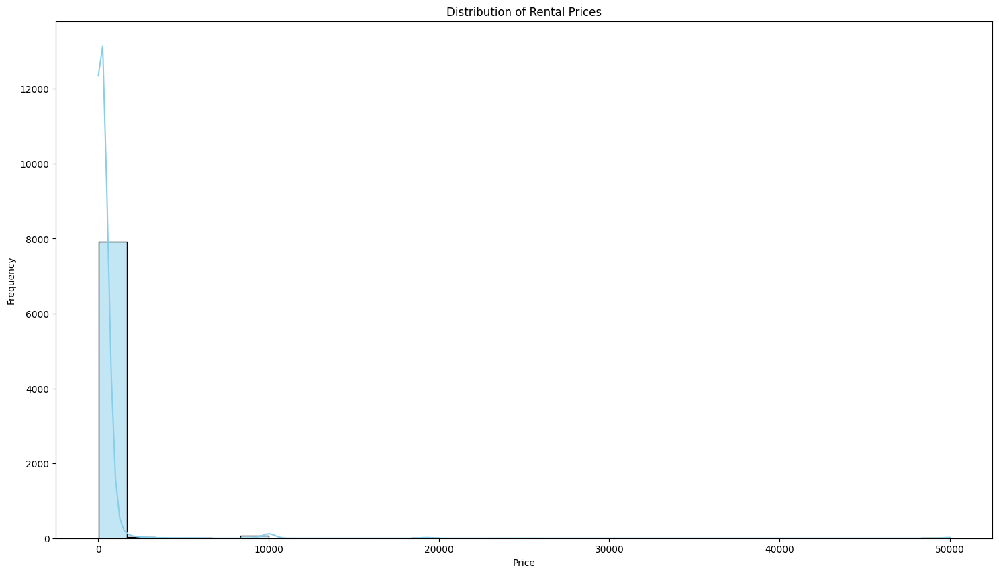

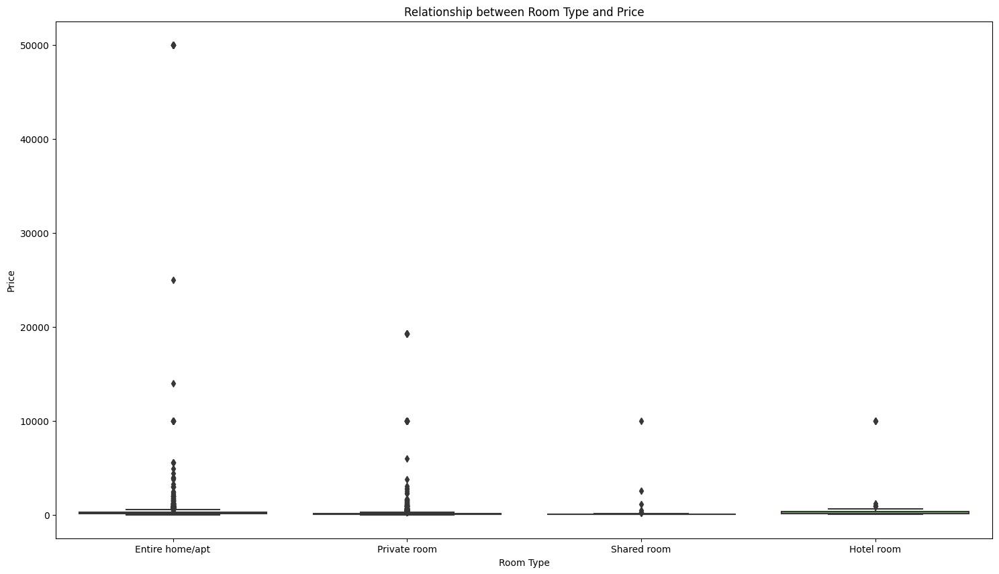

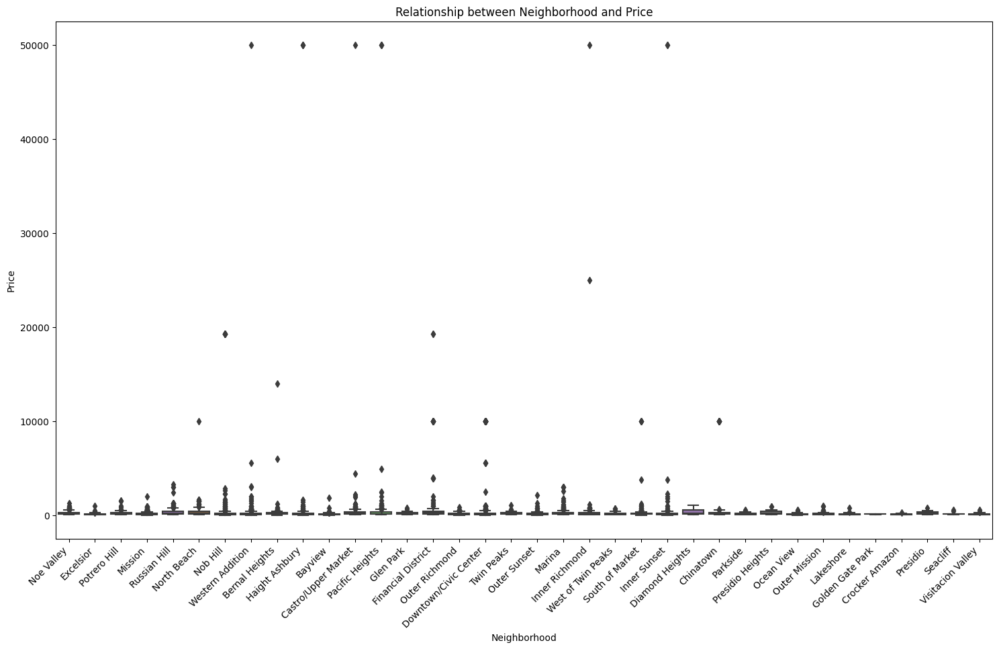

In [16]:
plt.figure(figsize=(18, 10))
sns.histplot(cleaned_df['price'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Rental Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

# Explore the relationship between room type and price
plt.figure(figsize=(18, 10))
sns.boxplot(x='room_type', y='price', data=cleaned_df, palette='viridis')
plt.title('Relationship between Room Type and Price')
plt.xlabel('Room Type')
plt.ylabel('Price')
plt.show()

# Explore the relationship between neighborhood and price
plt.figure(figsize=(18, 10))
sns.boxplot(x='neighbourhood', y='price', data=cleaned_df, palette='muted')
plt.title('Relationship between Neighborhood and Price')
plt.xlabel('Neighborhood')
plt.ylabel('Price')
plt.xticks(rotation=45, ha='right')
plt.show()

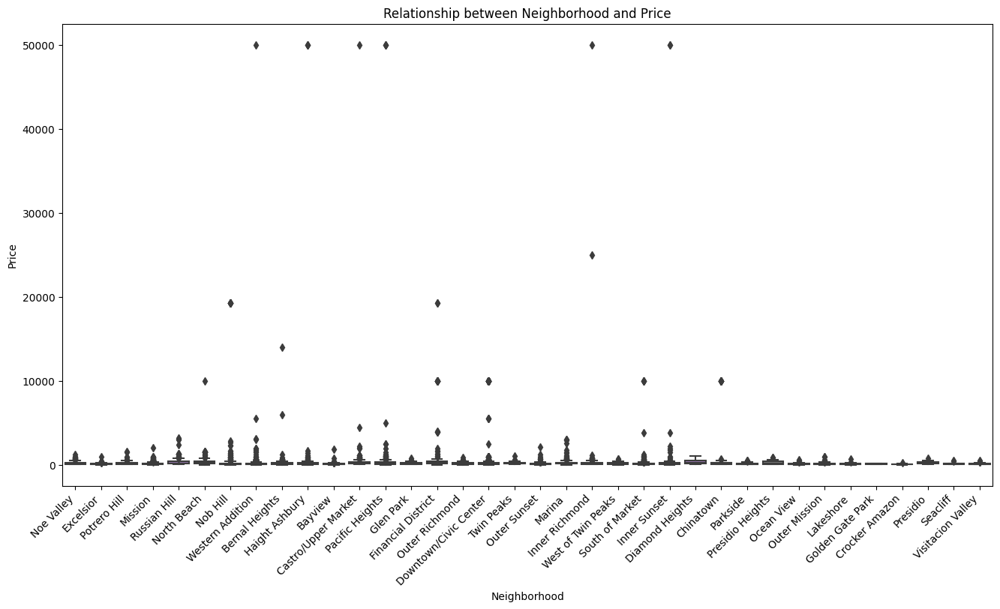

In [17]:
# Explore the relationship between neighborhood and price
plt.figure(figsize=(16, 8))
sns.boxplot(x='neighbourhood', y='price', data=cleaned_df, palette='muted')
plt.title('Relationship between Neighborhood and Price')
plt.xlabel('Neighborhood')
plt.ylabel('Price')
plt.xticks(rotation=45, ha='right')
plt.show()

Non-Numeric Columns: Index(['name', 'host_name', 'neighbourhood', 'room_type', 'last_review'], dtype='object')


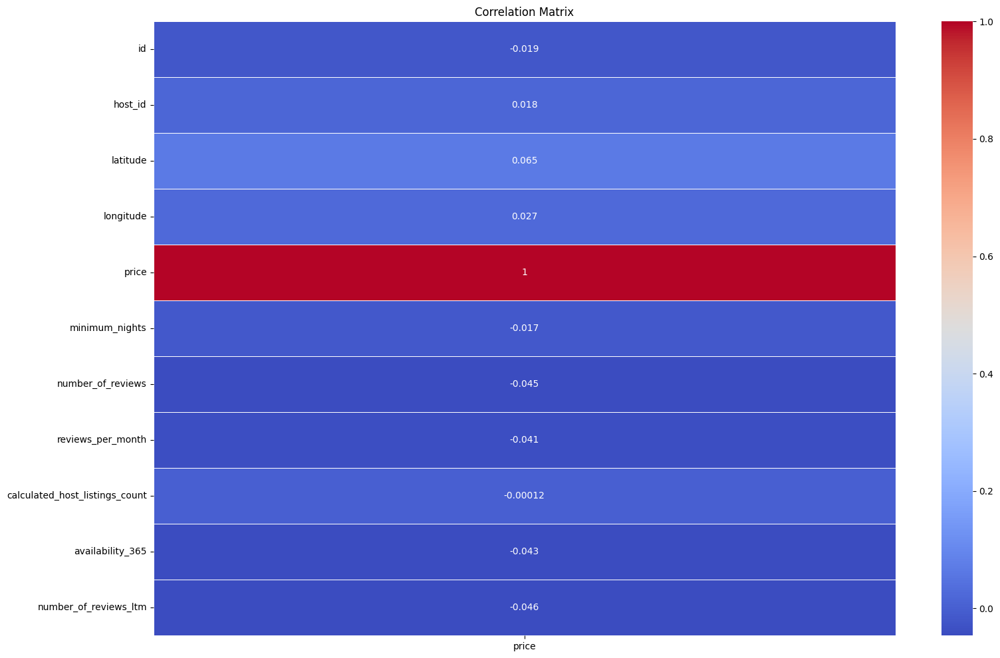

In [18]:
# Identify non-numeric columns
non_numeric_columns = cleaned_df.select_dtypes(exclude=['float64', 'int64']).columns
print("Non-Numeric Columns:", non_numeric_columns)

# Drop non-numeric columns for correlation matrix
numeric_df = cleaned_df.drop(columns=non_numeric_columns)

# Correlation matrix to identify features correlated with price
correlation_matrix = numeric_df.corr()

# Plot the correlation matrix
plt.figure(figsize=(18, 12))
sns.heatmap(correlation_matrix[['price']], annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

In [19]:
print(cleaned_df.dtypes)


id                                         int64
name                                      object
host_id                                    int64
host_name                                 object
neighbourhood                             object
latitude                                 float64
longitude                                float64
room_type                                 object
price                                      int64
minimum_nights                             int64
number_of_reviews                          int64
last_review                       datetime64[ns]
reviews_per_month                        float64
calculated_host_listings_count             int64
availability_365                           int64
number_of_reviews_ltm                      int64
dtype: object


In [20]:
# Select numerical columns for basic statistics
numerical_columns = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

# Display basic statistics
statistics_df = cleaned_df[numerical_columns].describe()

# Print the statistics
print(statistics_df)

              price  minimum_nights  number_of_reviews  reviews_per_month  \
count   8056.000000     8056.000000        8056.000000        8056.000000   
mean     392.071003       20.613704          47.044315           1.308681   
std     2182.756993       48.643332          98.818437           1.609766   
min       10.000000        1.000000           0.000000           0.010000   
25%       95.000000        2.000000           1.000000           0.260000   
50%      145.000000        3.000000           7.000000           1.090000   
75%      249.000000       30.000000          44.000000           1.308681   
max    50000.000000     1125.000000        1134.000000          35.880000   

       calculated_host_listings_count  availability_365  
count                     8056.000000       8056.000000  
mean                        23.931231        177.644613  
std                         54.417781        136.047253  
min                          1.000000          0.000000  
25%             

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

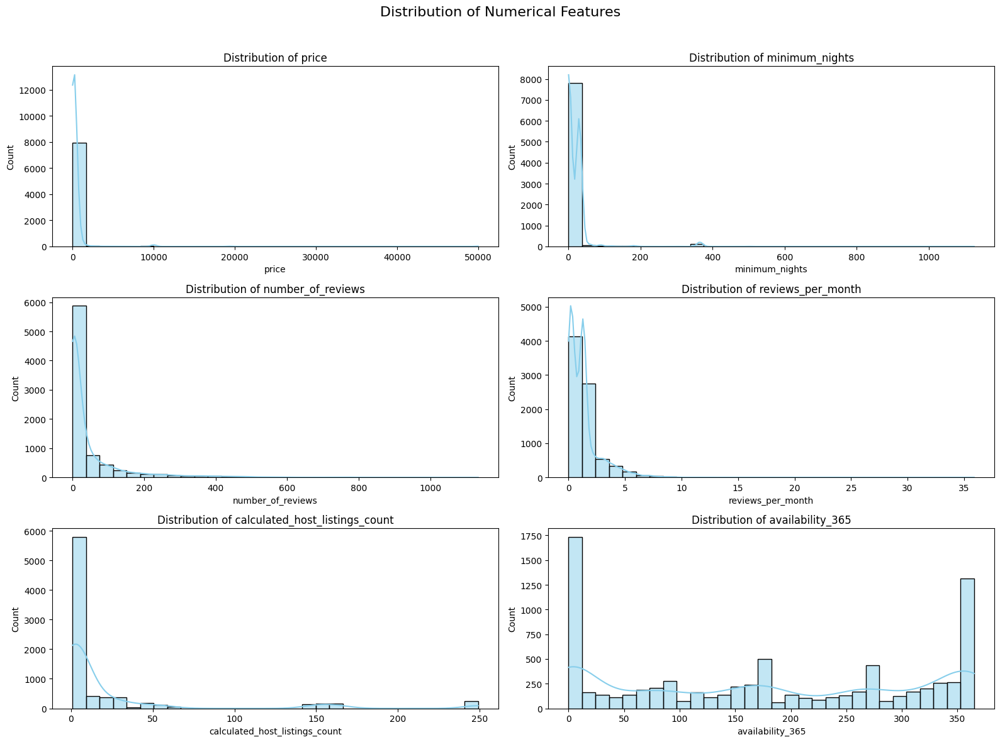

In [21]:
numerical_columns = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

# Set up subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(16, 12))
fig.suptitle('Distribution of Numerical Features', fontsize=16)

# Plot histograms and kernel density plots
for i, column in enumerate(numerical_columns):
    row, col = divmod(i, 2)
    sns.histplot(cleaned_df[column], kde=True, bins=30, color='skyblue', ax=axes[row, col])
    axes[row, col].set_title(f'Distribution of {column}')
    axes[row, col].set_xlabel(column)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

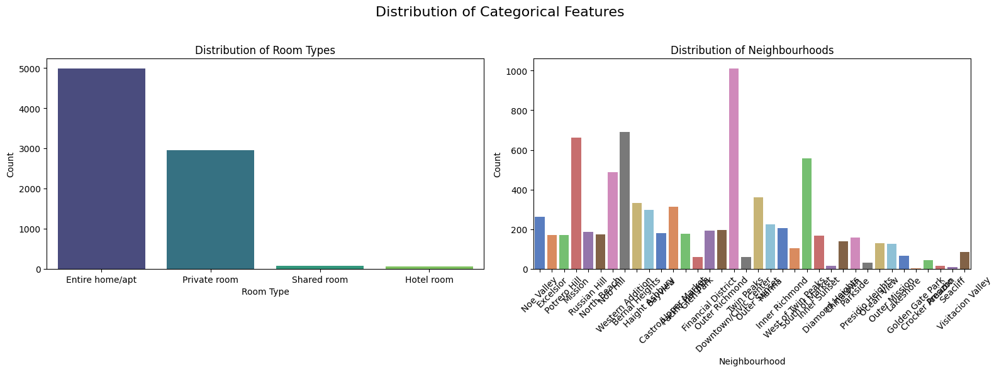

In [22]:
# Set up subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
fig.suptitle('Distribution of Categorical Features', fontsize=16)

# Plot the distribution of 'room_type'
sns.countplot(x='room_type', data=cleaned_df, palette='viridis', ax=axes[0])
axes[0].set_title('Distribution of Room Types')
axes[0].set_xlabel('Room Type')
axes[0].set_ylabel('Count')

# Plot the distribution of 'neighbourhood'
sns.countplot(x='neighbourhood', data=cleaned_df, palette='muted', ax=axes[1])
axes[1].set_title('Distribution of Neighbourhoods')
axes[1].set_xlabel('Neighbourhood')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=45)  # Remove or replace 'ha' parameter

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


/tmp/ipykernel_42/735916617.py:13: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='review_year', y='number_of_reviews', data=cleaned_df, estimator='sum', ci=None, marker='o', ax=axes[0])
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


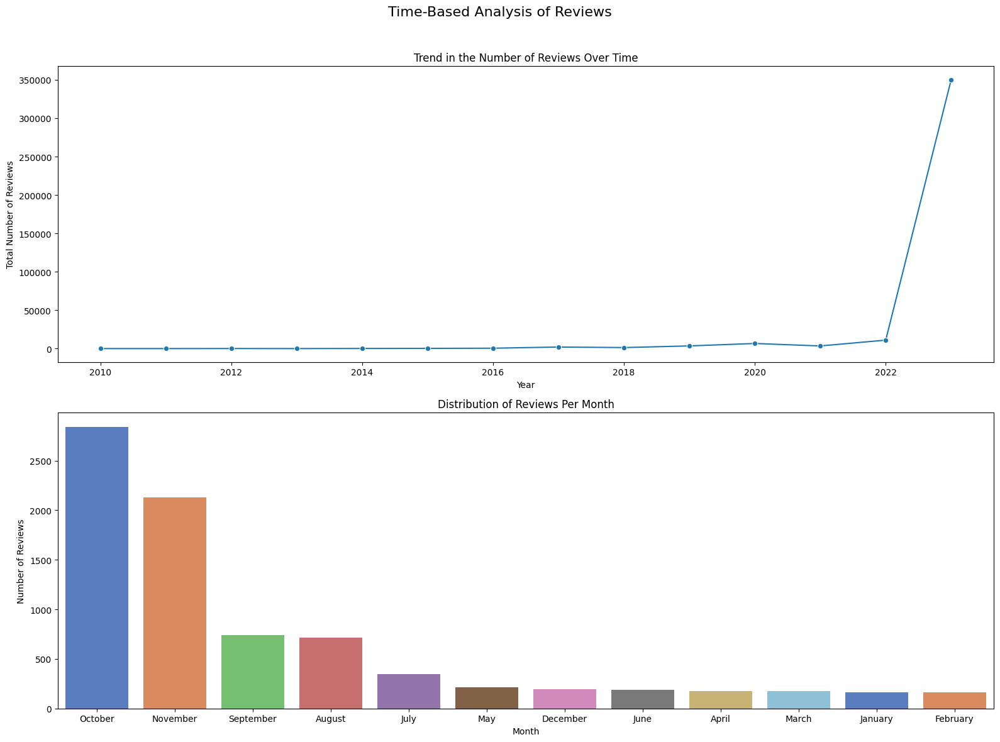

In [23]:
# Convert 'last_review' to datetime
cleaned_df['last_review'] = pd.to_datetime(cleaned_df['last_review'], errors='coerce')

# Extract year and month from 'last_review'
cleaned_df['review_year'] = cleaned_df['last_review'].dt.year
cleaned_df['review_month'] = cleaned_df['last_review'].dt.month_name()

# Set up subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 12))
fig.suptitle('Time-Based Analysis of Reviews', fontsize=16)

# Plot the trend in the number of reviews over time
sns.lineplot(x='review_year', y='number_of_reviews', data=cleaned_df, estimator='sum', ci=None, marker='o', ax=axes[0])
axes[0].set_title('Trend in the Number of Reviews Over Time')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Total Number of Reviews')

# Plot the distribution of reviews per month
sns.countplot(x='review_month', data=cleaned_df, order=cleaned_df['review_month'].value_counts().index, palette='muted', ax=axes[1])
axes[1].set_title('Distribution of Reviews Per Month')
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Number of Reviews')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

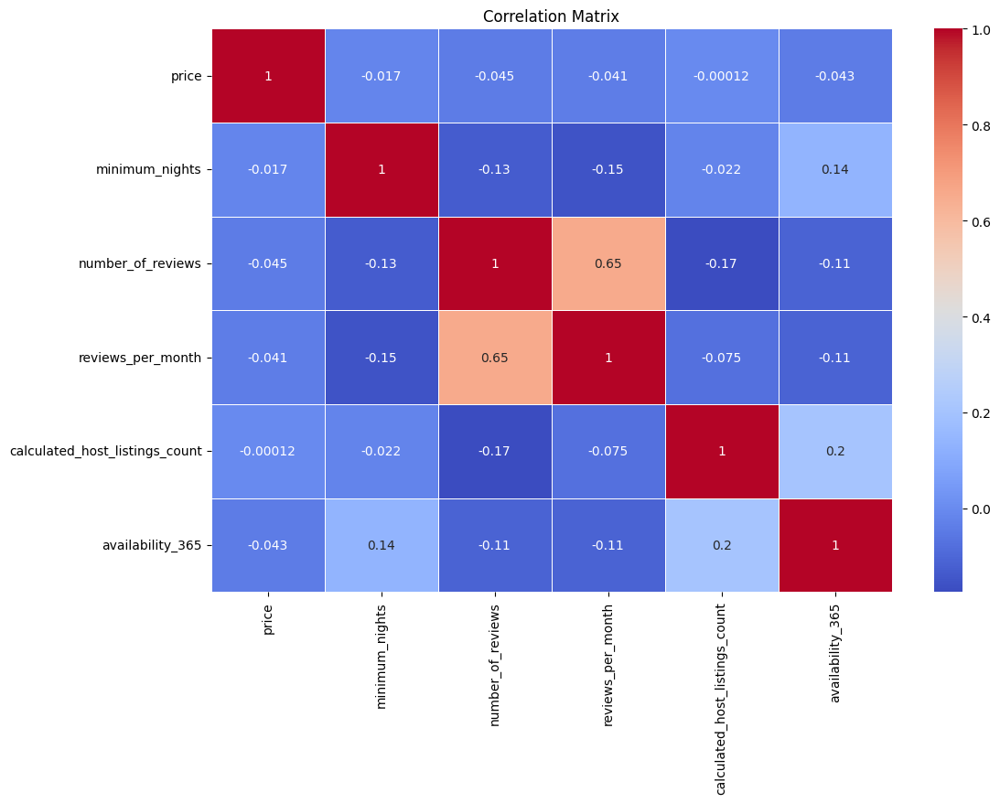

Correlation with Price:
 price                             1.000000
calculated_host_listings_count   -0.000118
minimum_nights                   -0.017007
reviews_per_month                -0.041176
availability_365                 -0.043299
number_of_reviews                -0.045045
Name: price, dtype: float64


In [24]:
# Select numerical columns for correlation analysis
numerical_columns = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

# Calculate the correlation matrix
correlation_matrix = cleaned_df[numerical_columns].corr()

# Plot the correlation matrix heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

# Identify features with strong correlation to 'price'
price_correlation = correlation_matrix['price'].sort_values(ascending=False)
print("Correlation with Price:\n", price_correlation)

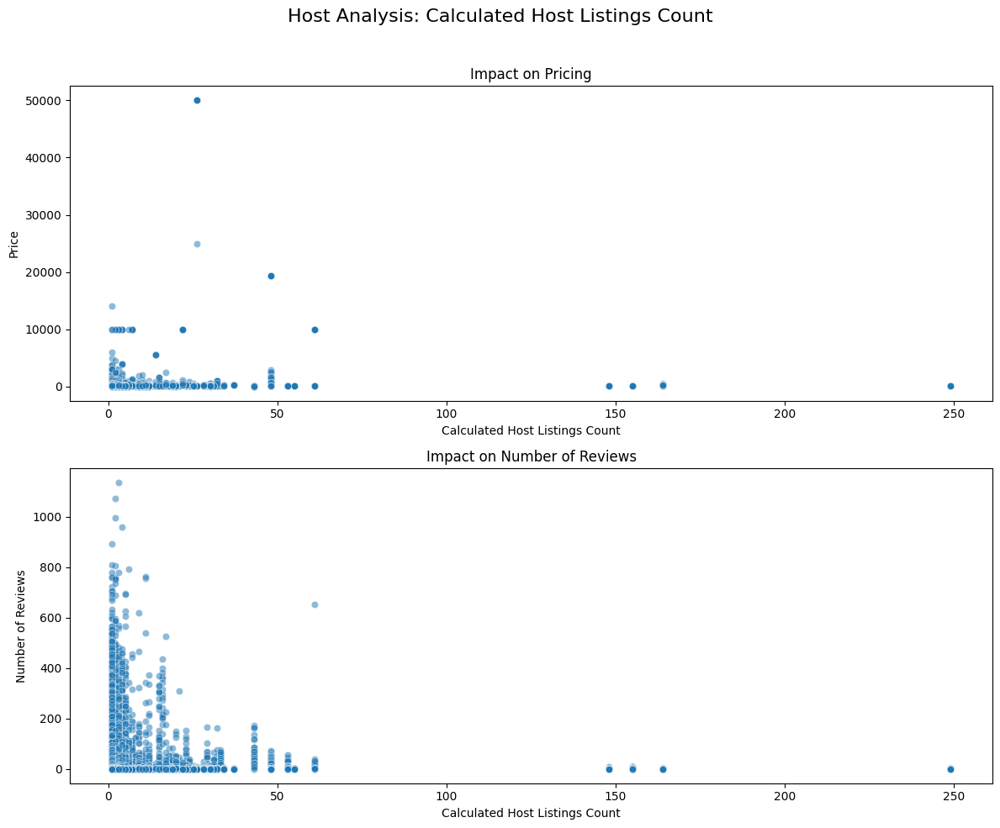

In [25]:
# Set up subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))
fig.suptitle("Host Analysis: Calculated Host Listings Count", fontsize=16)

# Analyze the impact on pricing
sns.scatterplot(x='calculated_host_listings_count', y='price', data=cleaned_df, alpha=0.5, ax=axes[0])
axes[0].set_title("Impact on Pricing")
axes[0].set_xlabel("Calculated Host Listings Count")
axes[0].set_ylabel("Price")

# Analyze the impact on reviews
sns.scatterplot(x='calculated_host_listings_count', y='number_of_reviews', data=cleaned_df, alpha=0.5, ax=axes[1])
axes[1].set_title("Impact on Number of Reviews")
axes[1].set_xlabel("Calculated Host Listings Count")
axes[1].set_ylabel("Number of Reviews")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

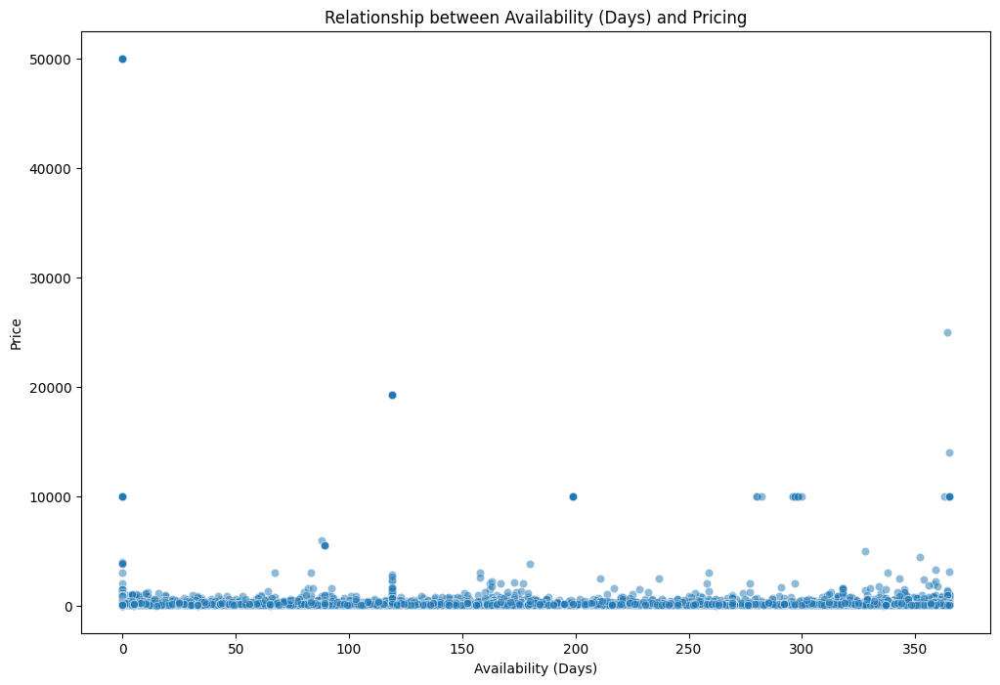

In [26]:
# Scatter plot to investigate the relationship between 'availability_365' and pricing
plt.figure(figsize=(12, 8))
sns.scatterplot(x='availability_365', y='price', data=cleaned_df, alpha=0.5, legend='auto')
plt.title("Relationship between Availability (Days) and Pricing")
plt.xlabel("Availability (Days)")
plt.ylabel("Price")
plt.show()

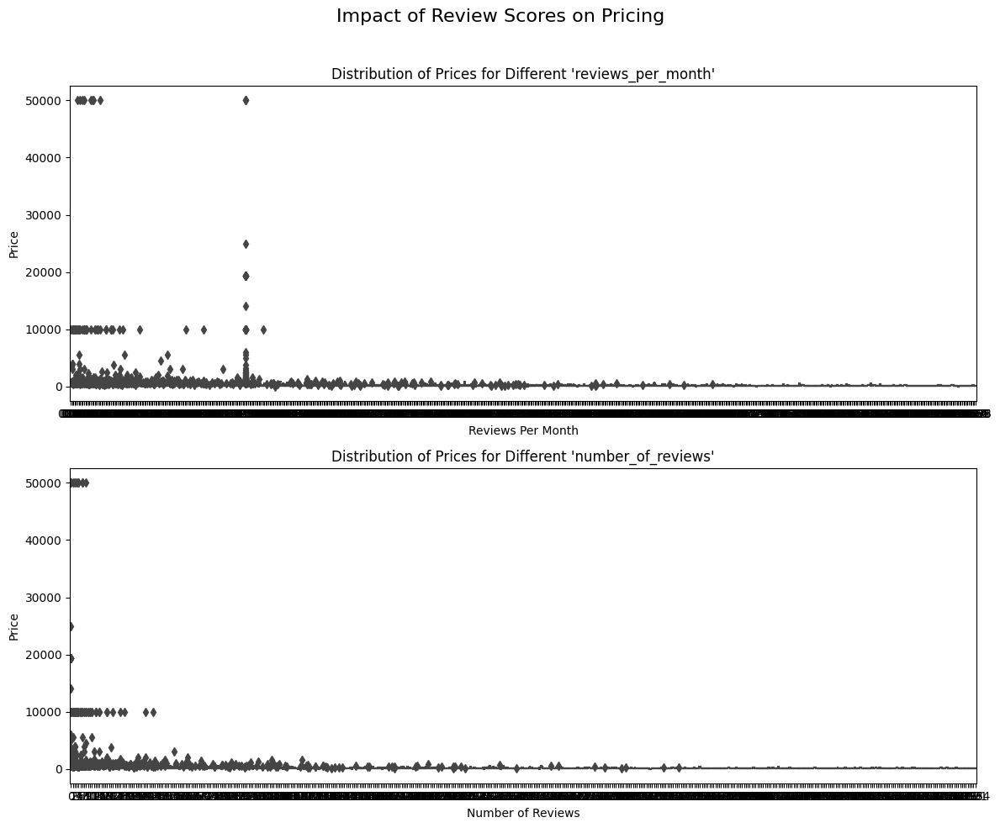

In [27]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))
fig.suptitle("Impact of Review Scores on Pricing", fontsize=16)

# Box plot for 'reviews_per_month' and pricing
sns.boxplot(x='reviews_per_month', y='price', data=cleaned_df, ax=axes[0])
axes[0].set_title("Distribution of Prices for Different 'reviews_per_month'")
axes[0].set_xlabel("Reviews Per Month")
axes[0].set_ylabel("Price")

# Box plot for 'number_of_reviews' and pricing
sns.boxplot(x='number_of_reviews', y='price', data=cleaned_df, ax=axes[1])
axes[1].set_title("Distribution of Prices for Different 'number_of_reviews'")
axes[1].set_xlabel("Number of Reviews")
axes[1].set_ylabel("Price")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [28]:
# import folium
# # Create a map centered around the mean latitude and longitude
# mean_lat, mean_lon = cleaned_df['latitude'].mean(), cleaned_df['longitude'].mean()
# map_center = [mean_lat, mean_lon]
# mymap = folium.Map(location=map_center, zoom_start=13)

# # Add markers for each listing
# for index, row in cleaned_df.iterrows():
#     folium.Marker([row['latitude'], row['longitude']], 
#                   popup=f"Price: ${row['price']}, Reviews: {row['number_of_reviews']}", 
#                   icon=folium.Icon(color='blue')).add_to(mymap)

# # Save the map as an HTML file (optional)
# mymap.save("listing_map.html")

# # Display the map
# mymap

In [29]:
cleaned_df.dtypes

id                                         int64
name                                      object
host_id                                    int64
host_name                                 object
neighbourhood                             object
latitude                                 float64
longitude                                float64
room_type                                 object
price                                      int64
minimum_nights                             int64
number_of_reviews                          int64
last_review                       datetime64[ns]
reviews_per_month                        float64
calculated_host_listings_count             int64
availability_365                           int64
number_of_reviews_ltm                      int64
review_year                                int32
review_month                              object
dtype: object

In [30]:
# Check if 'review_scores_rating' column exists and is numeric
if 'review_scores_rating' in cleaned_df.columns and cleaned_df['review_scores_rating'].dtype in ['int64', 'float64']:
    # Scatter plot for the relationship between number of reviews and prices
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    sns.scatterplot(x='number_of_reviews', y='price', data=cleaned_df)
    plt.title('Number of Reviews vs. Price')
    plt.xlabel('Number of Reviews')
    plt.ylabel('Price')

    # Scatter plot for the relationship between review scores and prices
    plt.subplot(1, 3, 2)
    sns.scatterplot(x='review_scores_rating', y='price', data=cleaned_df)
    plt.title('Review Scores vs. Price')
    plt.xlabel('Review Scores')
    plt.ylabel('Price')

    # Scatter plot for the relationship between reviews per month and prices
    plt.subplot(1, 3, 3)
    sns.scatterplot(x='reviews_per_month', y='price', data=cleaned_df)
    plt.title('Reviews per Month vs. Price')
    plt.xlabel('Reviews per Month')
    plt.ylabel('Price')

    plt.tight_layout()
    plt.show()

    # Calculate correlation matrix
    correlation_matrix = cleaned_df[['number_of_reviews', 'review_scores_rating', 'reviews_per_month', 'price']].corr()
    print(correlation_matrix)
else:
    print("The 'review_scores_rating' column either doesn't exist or is not of a numeric data type.")

The 'review_scores_rating' column either doesn't exist or is not of a numeric data type.


/tmp/ipykernel_42/605135337.py:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='review_month', y='price', data=cleaned_df, ci=None, ax=axes[0], sort=False)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_42/605135337.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='review_month', y='number_of_reviews', data=cleaned_df, ci=None, ax=axes[1], sort=False)
/opt/conda/lib/pyt

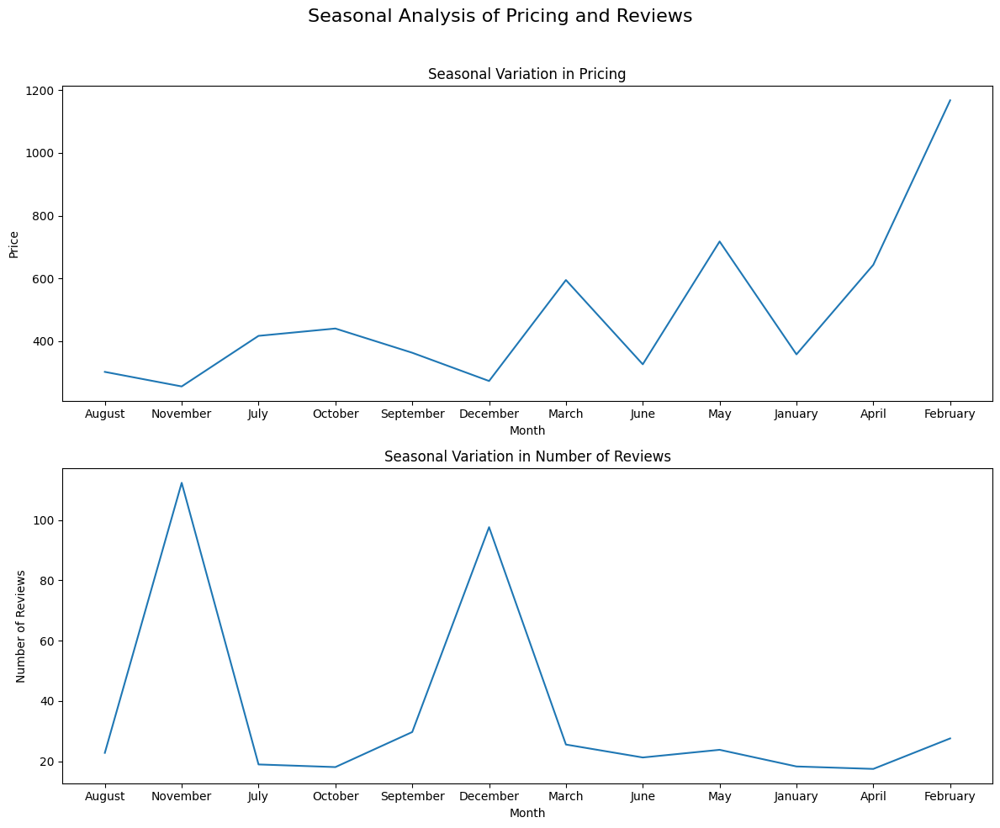

In [31]:

# Extract month and year from 'last_review'
cleaned_df['review_month'] = cleaned_df['last_review'].dt.month_name()
cleaned_df['review_year'] = cleaned_df['last_review'].dt.year

# Set up subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))
fig.suptitle("Seasonal Analysis of Pricing and Reviews", fontsize=16)

# Seasonal analysis of pricing
sns.lineplot(x='review_month', y='price', data=cleaned_df, ci=None, ax=axes[0], sort=False)
axes[0].set_title("Seasonal Variation in Pricing")
axes[0].set_xlabel("Month")
axes[0].set_ylabel("Price")

# Seasonal analysis of reviews
sns.lineplot(x='review_month', y='number_of_reviews', data=cleaned_df, ci=None, ax=axes[1], sort=False)
axes[1].set_title("Seasonal Variation in Number of Reviews")
axes[1].set_xlabel("Month")
axes[1].set_ylabel("Number of Reviews")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

/tmp/ipykernel_42/1299378162.py:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='last_review', y='price', data=cleaned_df, ci=None, ax=axes[0])
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_42/1299378162.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='last_review', y='minimum_nights', data=cleaned_df, ci=None, ax=axes[1])
/opt/conda/lib/python3.10/site-packages/seabo

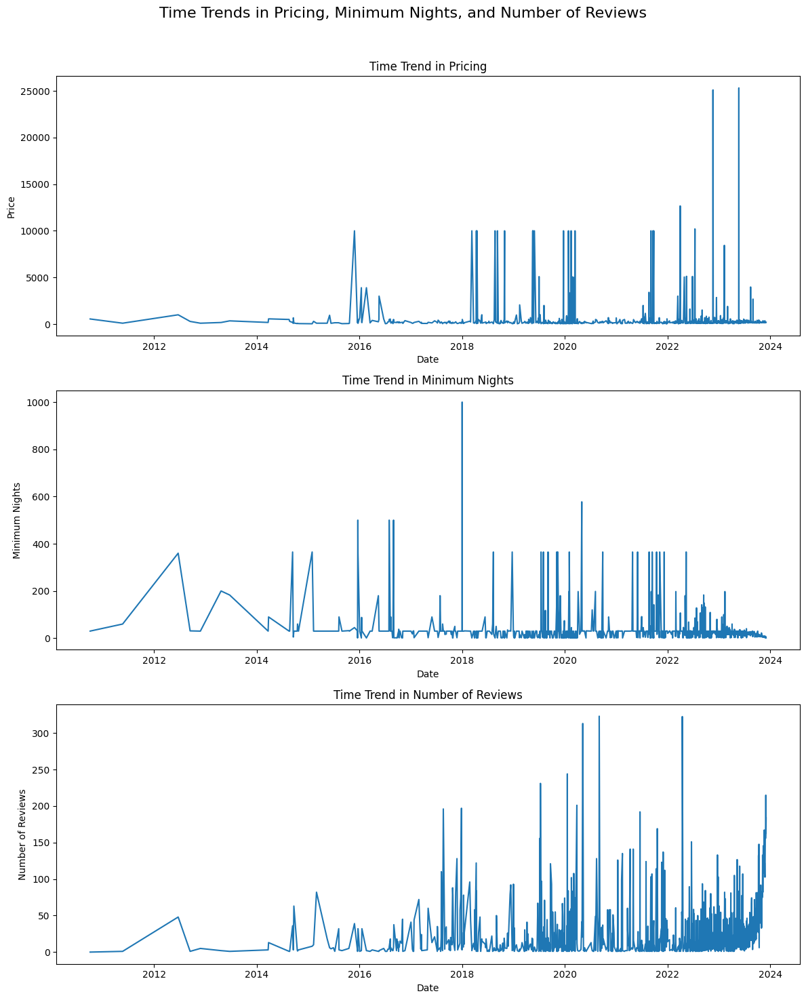

In [32]:
# Extract year and month from 'last_review'
cleaned_df['review_year'] = cleaned_df['last_review'].dt.year
cleaned_df['review_month'] = cleaned_df['last_review'].dt.month_name()

# Set up subplots
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 15))
fig.suptitle("Time Trends in Pricing, Minimum Nights, and Number of Reviews", fontsize=16)

# Time trend in pricing
sns.lineplot(x='last_review', y='price', data=cleaned_df, ci=None, ax=axes[0])
axes[0].set_title("Time Trend in Pricing")
axes[0].set_xlabel("Date")
axes[0].set_ylabel("Price")

# Time trend in minimum nights
sns.lineplot(x='last_review', y='minimum_nights', data=cleaned_df, ci=None, ax=axes[1])
axes[1].set_title("Time Trend in Minimum Nights")
axes[1].set_xlabel("Date")
axes[1].set_ylabel("Minimum Nights")

# Time trend in number of reviews
sns.lineplot(x='last_review', y='number_of_reviews', data=cleaned_df, ci=None, ax=axes[2])
axes[2].set_title("Time Trend in Number of Reviews")
axes[2].set_xlabel("Date")
axes[2].set_ylabel("Number of Reviews")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


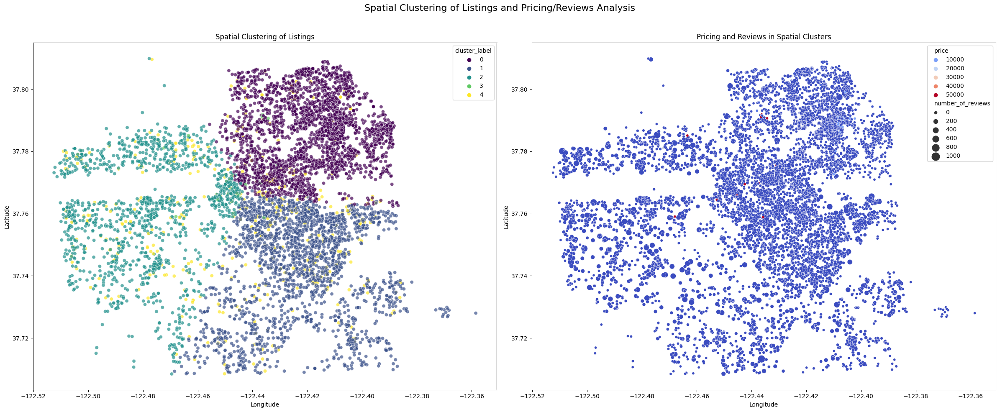

In [33]:
from sklearn.cluster import KMeans
# Select relevant features for clustering
cluster_features = cleaned_df[['latitude', 'longitude', 'price', 'number_of_reviews']]

# Normalize the features
normalized_features = (cluster_features - cluster_features.mean()) / cluster_features.std()

# Specify the number of clusters (you may adjust this based on your analysis)
n_clusters = 5

# Apply K-means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(normalized_features)

# Add cluster labels to the DataFrame
cleaned_df['cluster_label'] = cluster_labels

# Set up subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(24, 10))
fig.suptitle("Spatial Clustering of Listings and Pricing/Reviews Analysis", fontsize=16)

# Plot spatial clusters
sns.scatterplot(x='longitude', y='latitude', hue='cluster_label', data=cleaned_df, palette='viridis', alpha=0.7, ax=axes[0])
axes[0].set_title("Spatial Clustering of Listings")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")

# Plot pricing and reviews within each cluster
sns.scatterplot(x='longitude', y='latitude', hue='price', size='number_of_reviews', sizes=(20, 200), data=cleaned_df, palette='coolwarm', ax=axes[1])
axes[1].set_title("Pricing and Reviews in Spatial Clusters")
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

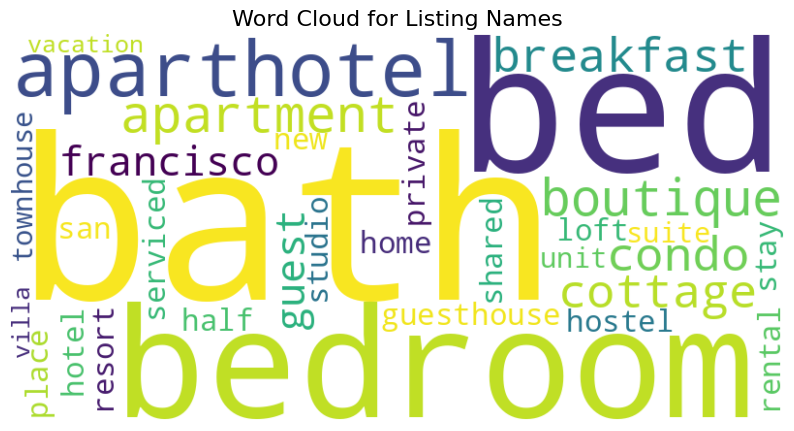

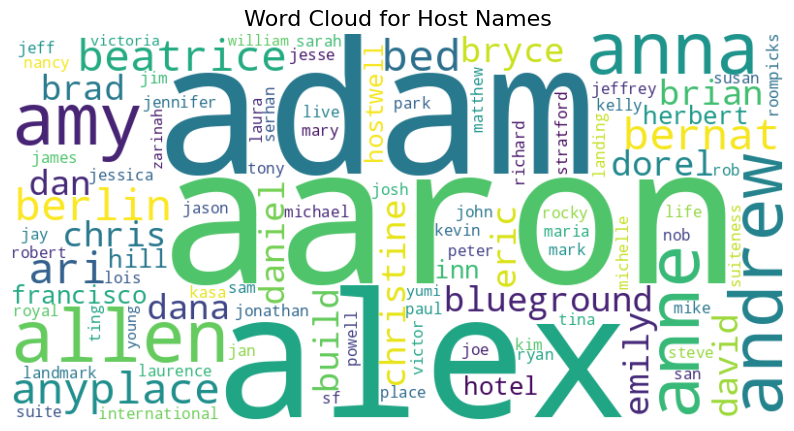

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer

# Load the cleaned dataset
# cleaned_df = pd.read_csv("cleaned_listings.csv")

# Helper function to create a word cloud
def create_wordcloud(data, title):
    wordcloud = WordCloud(width=800, height=400, max_words=150, background_color='white').generate(' '.join(data))
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title, fontsize=16)
    plt.axis('off')
    plt.show()

# Analyze 'name' column
name_vectorizer = CountVectorizer(stop_words='english', max_features=100)
name_matrix = name_vectorizer.fit_transform(cleaned_df['name'])
name_features = name_vectorizer.get_feature_names_out()
name_counts = name_matrix.sum(axis=0).A1
name_freq = dict(zip(name_features, name_counts))
create_wordcloud(name_freq, "Word Cloud for Listing Names")

# Analyze 'host_name' column
host_name_vectorizer = CountVectorizer(stop_words='english', max_features=100)
host_name_matrix = host_name_vectorizer.fit_transform(cleaned_df['host_name'])
host_name_features = host_name_vectorizer.get_feature_names_out()
host_name_counts = host_name_matrix.sum(axis=0).A1
host_name_freq = dict(zip(host_name_features, host_name_counts))
create_wordcloud(host_name_freq, "Word Cloud for Host Names")

In [35]:
# from textblob import TextBlob

# # Perform sentiment analysis on reviews
# cleaned_df['review_sentiment'] = cleaned_df['comments'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)

# # Plot sentiment distribution
# plt.figure(figsize=(10, 6))
# sns.histplot(cleaned_df['review_sentiment'], bins=30, kde=True, color='skyblue')
# plt.title("Distribution of Review Sentiments")
# plt.xlabel("Sentiment Polarity")
# plt.ylabel("Count")
# plt.show()


In [36]:
cleaned_df.dtypes

id                                         int64
name                                      object
host_id                                    int64
host_name                                 object
neighbourhood                             object
latitude                                 float64
longitude                                float64
room_type                                 object
price                                      int64
minimum_nights                             int64
number_of_reviews                          int64
last_review                       datetime64[ns]
reviews_per_month                        float64
calculated_host_listings_count             int64
availability_365                           int64
number_of_reviews_ltm                      int64
review_year                                int32
review_month                              object
cluster_label                              int32
dtype: object

Explained Variance Ratio with 10 components: 0.32


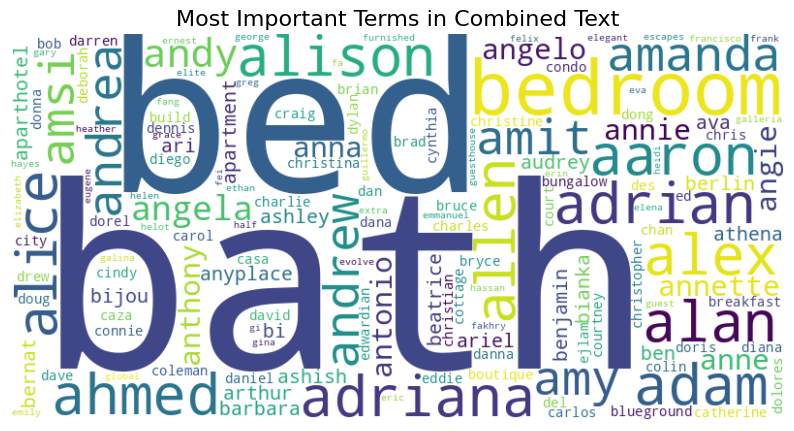

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

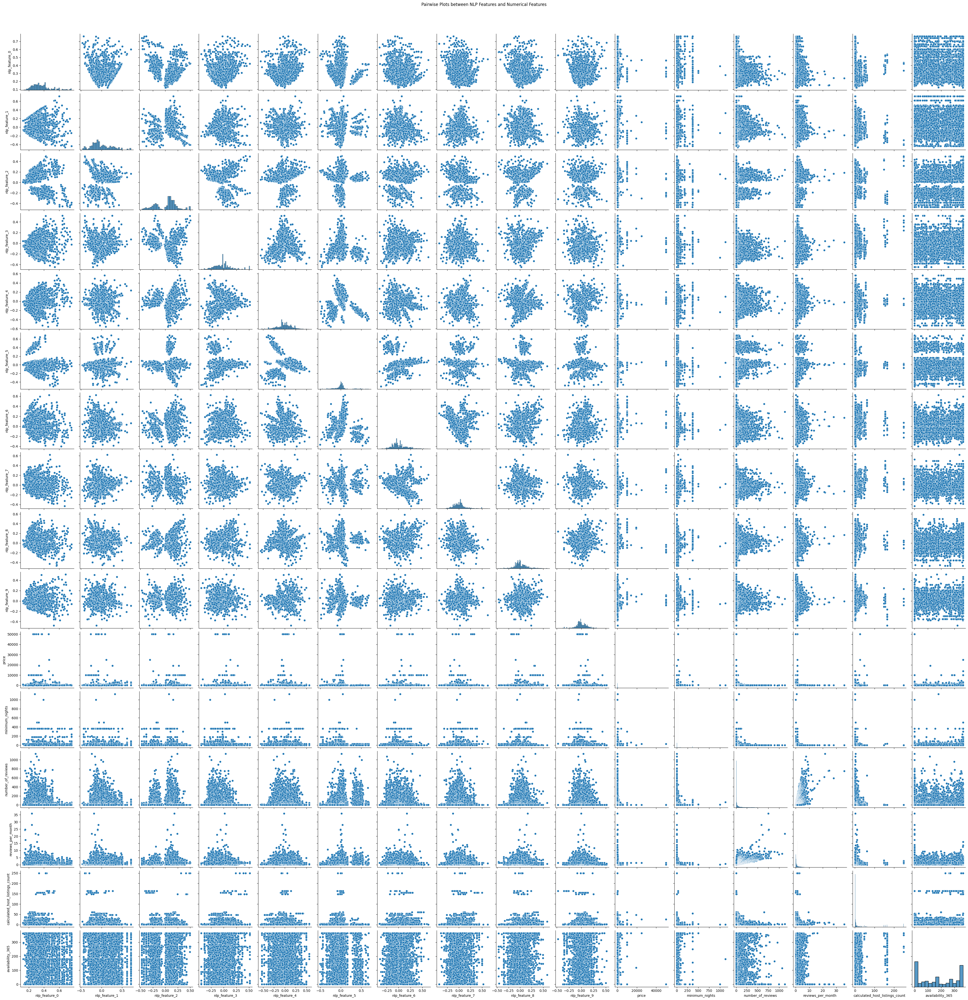

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from wordcloud import WordCloud

# Load the cleaned dataset
# cleaned_df = pd.read_csv("cleaned_listings.csv")

# Combine 'name' and 'host_name' for analysis
combined_text = cleaned_df['name'] + ' ' + cleaned_df['host_name']

# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=500)
tfidf_matrix = tfidf_vectorizer.fit_transform(combined_text)

# Apply Truncated SVD for dimensionality reduction
n_components = 10  # You may adjust this based on your analysis
svd = TruncatedSVD(n_components=n_components)
svd_matrix = svd.fit_transform(tfidf_matrix)

# Visualize the most important terms in reduced dimensions
terms = tfidf_vectorizer.get_feature_names_out()
explained_variance_ratio = svd.explained_variance_ratio_.sum()
print(f"Explained Variance Ratio with {n_components} components: {explained_variance_ratio:.2f}")

# Plot the most important terms in word cloud
term_importance = svd.components_.sum(axis=0)
term_importance_dict = dict(zip(terms, term_importance))
create_wordcloud(term_importance_dict, "Most Important Terms in Combined Text")

# Explore relationships with other numerical features
numerical_features = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

# Pairwise plots between NLP features and numerical features
nlp_numerical_df = pd.DataFrame(svd_matrix, columns=[f"nlp_feature_{i}" for i in range(n_components)])
nlp_numerical_df[numerical_features] = cleaned_df[numerical_features]
sns.pairplot(nlp_numerical_df)
plt.suptitle("Pairwise Plots between NLP Features and Numerical Features", y=1.02)
plt.show()


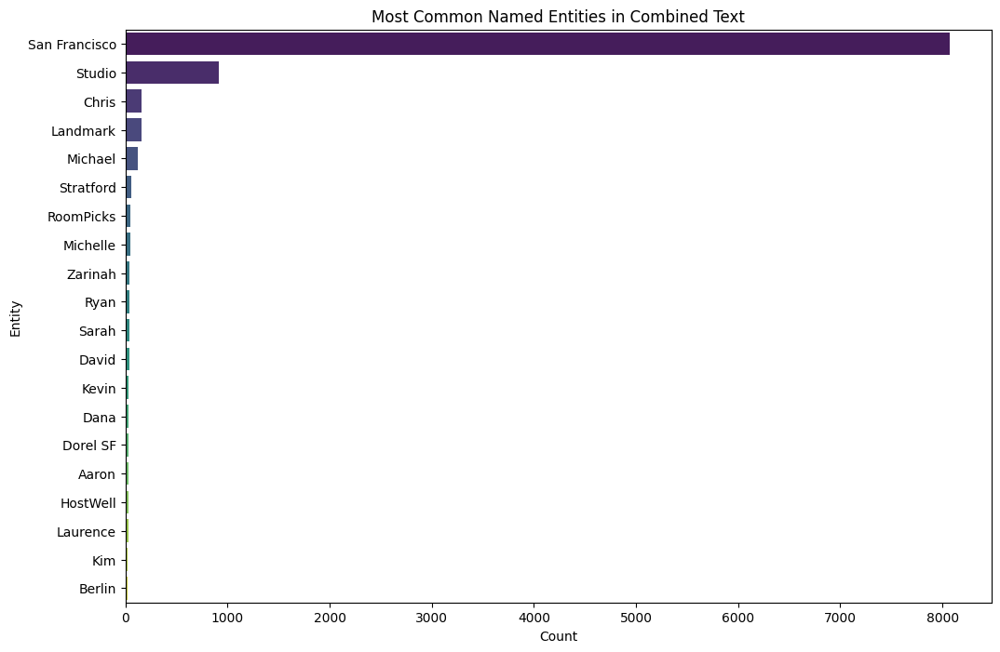

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import spacy
from collections import Counter

# Load the spaCy model
nlp = spacy.load("en_core_web_sm")

# Load the cleaned dataset
# cleaned_df = pd.read_csv("cleaned_listings.csv")

# Combine 'name' and 'host_name' for analysis
combined_text = cleaned_df['name'] + ' ' + cleaned_df['host_name']

# Function to perform named entity recognition (NER)
def perform_ner(text):
    doc = nlp(text)
    entities = [ent.text for ent in doc.ents if ent.label_ in ['ORG', 'PERSON', 'GPE']]
    return entities

# Apply NER to the combined text
combined_entities = combined_text.apply(perform_ner)

# Flatten the list of entities
flat_entities = [entity for sublist in combined_entities for entity in sublist]

# Count the occurrences of each entity
entity_counts = Counter(flat_entities)

# Plot the most common named entities
common_entities = entity_counts.most_common(20)
common_entities_df = pd.DataFrame(common_entities, columns=['Entity', 'Count'])

plt.figure(figsize=(12, 8))
sns.barplot(x='Count', y='Entity', data=common_entities_df, palette='viridis')
plt.title("Most Common Named Entities in Combined Text")
plt.xlabel("Count")
plt.ylabel("Entity")
plt.show()


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


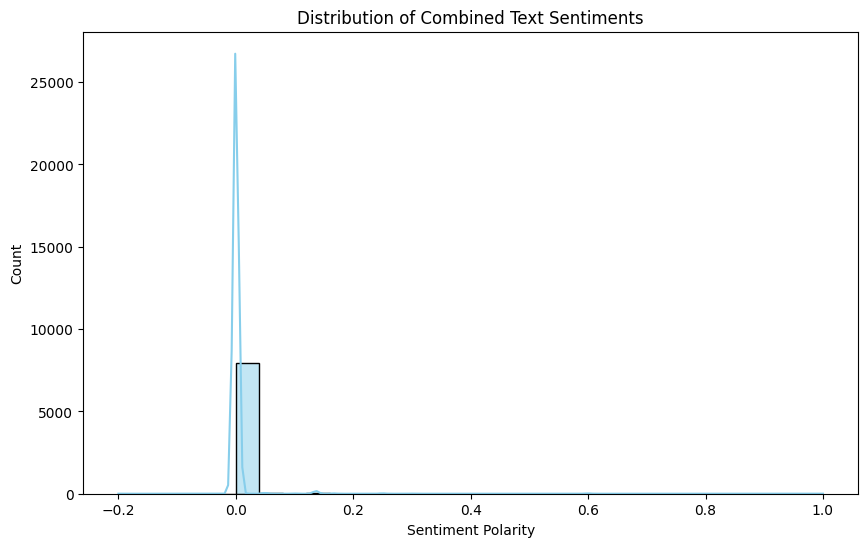

Top words for each topic:
Topic 1: bath, san, francisco, private, hotel, studio, bed, bedroom, beds, boutique
Topic 2: rental, unit, bath, san, francisco, bed, bedroom, studio, serviced, apartment
Topic 3: bedroom, san, francisco, bed, bath, shared, home, guest, suite, private
Topic 4: francisco, san, bath, bedroom, bed, new, hotel, allen, chris, suite
Topic 5: beds, bedrooms, francisco, san, baths, home, bath, condo, 95, townhouse


In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Combine 'name' and 'host_name' for analysis
combined_text = cleaned_df['name'] + ' ' + cleaned_df['host_name']

# Sentiment Analysis
cleaned_df['combined_sentiment'] = combined_text.apply(lambda x: TextBlob(str(x)).sentiment.polarity)

# Plot sentiment distribution
plt.figure(figsize=(10, 6))
sns.histplot(cleaned_df['combined_sentiment'], bins=30, kde=True, color='skyblue')
plt.title("Distribution of Combined Text Sentiments")
plt.xlabel("Sentiment Polarity")
plt.ylabel("Count")
plt.show()

# Topic Modeling with LDA
vectorizer = CountVectorizer(stop_words='english', max_features=500)
vectorized_text = vectorizer.fit_transform(combined_text)

# Apply LDA for topic modeling
n_topics = 5  # You may adjust the number of topics
lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda_matrix = lda.fit_transform(vectorized_text)

# Display the top words for each topic
feature_names = vectorizer.get_feature_names_out()
topic_top_words = {}
for topic_idx, topic in enumerate(lda.components_):
    top_words_idx = topic.argsort()[:-10 - 1:-1]
    top_words = [feature_names[i] for i in top_words_idx]
    topic_top_words[f"Topic {topic_idx + 1}"] = top_words

print("Top words for each topic:")
for topic, words in topic_top_words.items():
    print(f"{topic}: {', '.join(words)}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 7.0 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: nltk
    Found existing installation: nltk 3.2.4
    Uninstalling nltk-3.2.4:
      Successfully uninstalled nltk-3.2.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
preprocessing 0.1.13 requires nltk==3.2.4, but you have nltk 3.8.1 which is incompatible.


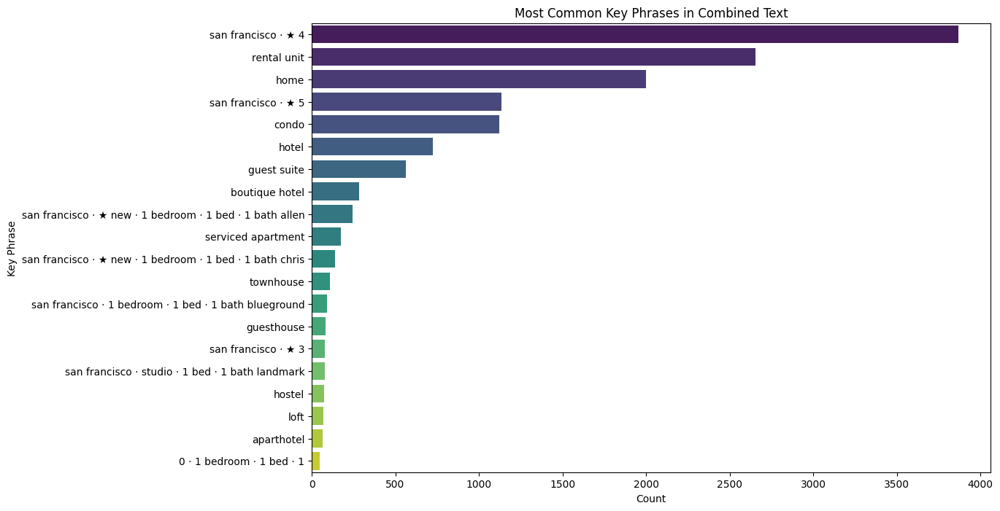

In [40]:
!pip install rake_nltk

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from rake_nltk import Rake
import spacy
from collections import Counter

# Load the spaCy model
nlp = spacy.load("en_core_web_sm")

# Load the cleaned dataset
cleaned_df = pd.read_csv("cleaned_listings.csv")

# Combine 'name' and 'host_name' for analysis
combined_text = cleaned_df['name'] + ' ' + cleaned_df['host_name']

# Function to extract key phrases using RAKE
def extract_key_phrases(text):
    r = Rake()
    r.extract_keywords_from_text(text)
    return r.get_ranked_phrases()

# Apply RAKE for key phrase extraction
key_phrases = combined_text.apply(extract_key_phrases)

# Flatten the list of key phrases
flat_phrases = [phrase for sublist in key_phrases for phrase in sublist]

# Count the occurrences of each key phrase
phrase_counts = Counter(flat_phrases)

# Plot the most common key phrases
common_phrases = phrase_counts.most_common(20)
common_phrases_df = pd.DataFrame(common_phrases, columns=['Key Phrase', 'Count'])

plt.figure(figsize=(12, 8))
sns.barplot(x='Count', y='Key Phrase', data=common_phrases_df, palette='viridis')
plt.title("Most Common Key Phrases in Combined Text")
plt.xlabel("Count")
plt.ylabel("Key Phrase")
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

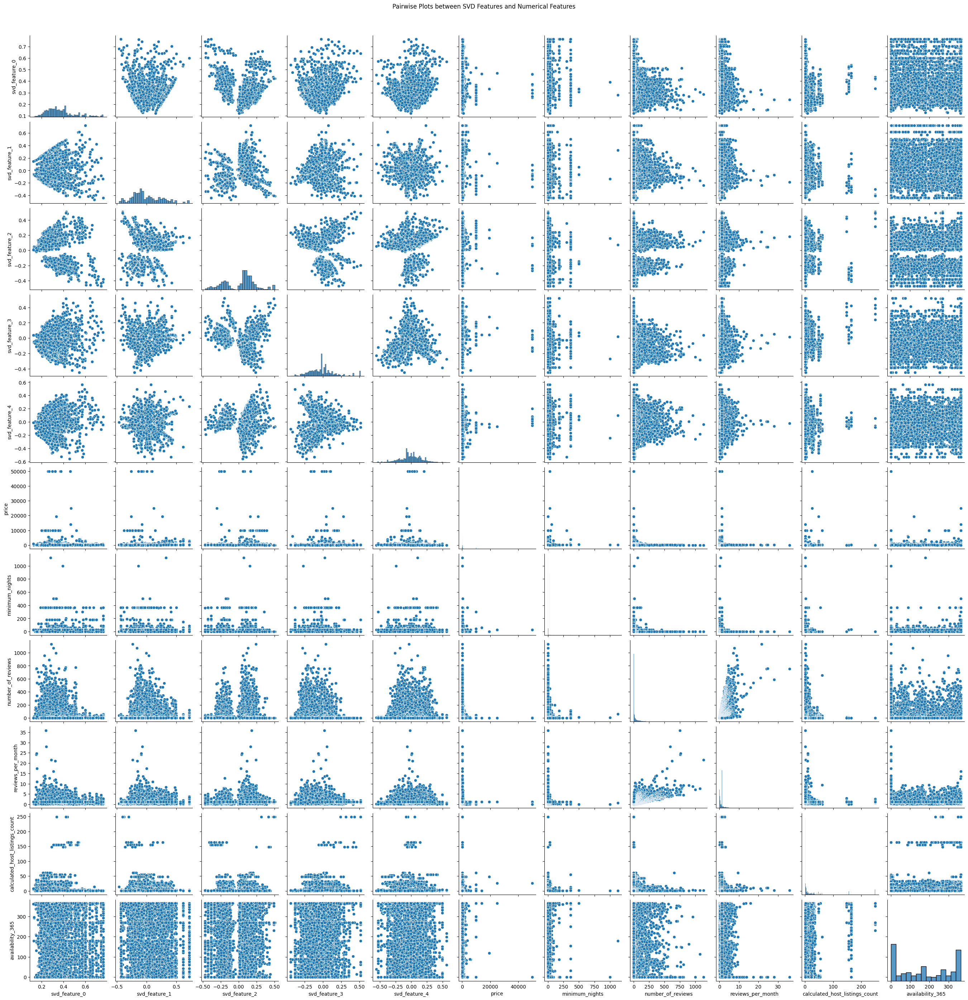

In [41]:
# TF-IDF Vectorization and Truncated SVD
vectorizer = TfidfVectorizer(stop_words='english', max_features=500)
vectorized_text = vectorizer.fit_transform(combined_text)

n_components = 5  # Adjust the number of components as needed
svd = TruncatedSVD(n_components=n_components)
svd_matrix = svd.fit_transform(vectorized_text)

# Create a DataFrame with numerical features and SVD components
numerical_features = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']
svd_df = pd.DataFrame(svd_matrix, columns=[f"svd_feature_{i}" for i in range(n_components)])
svd_df[numerical_features] = cleaned_df[numerical_features]

# Pairwise Plots between SVD Features and Numerical Features
sns.pairplot(svd_df)
plt.suptitle("Pairwise Plots between SVD Features and Numerical Features", y=1.02)
plt.show()

## Feature Engineering

In [42]:
cleaned_df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
dtype: object

In [43]:
# Feature engineering: Length of 'name' and 'host_name'
cleaned_df['name_length'] = cleaned_df['name'].apply(len)
cleaned_df['host_name_length'] = cleaned_df['host_name'].apply(len)


In [44]:
# Feature engineering: Word count in 'name' and 'host_name'
cleaned_df['name_word_count'] = cleaned_df['name'].apply(lambda x: len(str(x).split()))
cleaned_df['host_name_word_count'] = cleaned_df['host_name'].apply(lambda x: len(str(x).split()))


In [45]:
# Feature engineering: Punctuation count in 'name' and 'host_name'
cleaned_df['name_punctuation_count'] = cleaned_df['name'].apply(lambda x: sum(c.isdigit() or c.isspace() or not c.isalnum() for c in str(x)))
cleaned_df['host_name_punctuation_count'] = cleaned_df['host_name'].apply(lambda x: sum(c.isdigit() or c.isspace() or not c.isalnum() for c in str(x)))


In [46]:
# Feature engineering: Room type one-hot encoding
room_type_dummies = pd.get_dummies(cleaned_df['room_type'], prefix='room_type', drop_first=True)
cleaned_df = pd.concat([cleaned_df, room_type_dummies], axis=1)


In [47]:
# Feature engineering: Neighborhood popularity
neighborhood_popularity = cleaned_df.groupby('neighbourhood')['number_of_reviews'].mean().reset_index()
neighborhood_popularity.rename(columns={'number_of_reviews': 'neighborhood_popularity'}, inplace=True)
cleaned_df = pd.merge(cleaned_df, neighborhood_popularity, on='neighbourhood', how='left')


In [48]:
# Feature engineering: Host listings ratio
cleaned_df['host_listings_ratio'] = cleaned_df['calculated_host_listings_count'] / cleaned_df['calculated_host_listings_count'].sum()


In [49]:
cleaned_df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
name_length                         int64
host_name_length                    int64
name_word_count                     int64
host_name_word_count                int64
name_punctuation_count              int64
host_name_punctuation_count         int64
room_type_Hotel room                 bool
room_type_Private room            

In [50]:
# Assuming you have handled missing values and encoded categorical variables in the cleaned_df
# Split the dataset into features (X) and target variable (y)
X = cleaned_df.drop(['price'], axis=1)
y = cleaned_df['price']


In [51]:
from sklearn.model_selection import train_test_split

# Split the dataset into 80% training and 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [52]:
# Drop original categorical columns
categorical_columns_to_drop = ['id','host_id', 'name', 'host_name', 'neighbourhood', 'room_type', 'last_review']
training_df = cleaned_df.drop(columns=categorical_columns_to_drop, axis=1)


In [53]:
training_df.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,name_length,host_name_length,name_word_count,host_name_word_count,name_punctuation_count,host_name_punctuation_count,room_type_Hotel room,room_type_Private room,room_type_Shared room,neighborhood_popularity,host_listings_ratio
0,37.75635,-122.42864,1250,5,34,0.23,1,80,2,61,12,15,3,26,3,False,False,False,57.492366,0.000005
1,37.72369,-122.42865,79,2,149,1.92,1,196,20,67,4,16,1,27,0,False,True,False,62.912281,0.000005
2,37.75622,-122.39821,249,5,36,0.26,1,202,7,68,6,16,1,27,0,False,False,False,81.829412,0.000005
3,37.75884,-122.42232,125,30,196,1.41,1,149,4,65,6,16,1,27,0,False,False,False,43.346445,0.000005
4,37.76111,-122.42082,70,30,2,0.02,1,0,0,53,3,13,1,18,0,False,False,False,43.346445,0.000005


In [54]:
training_df.dtypes

latitude                          float64
longitude                         float64
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
name_length                         int64
host_name_length                    int64
name_word_count                     int64
host_name_word_count                int64
name_punctuation_count              int64
host_name_punctuation_count         int64
room_type_Hotel room                 bool
room_type_Private room               bool
room_type_Shared room                bool
neighborhood_popularity           float64
host_listings_ratio               float64
dtype: object

## Feature Scaling 

In [97]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assuming 'cleaned_df' is your preprocessed DataFrame
# Split the dataset into features (X) and target variable (y)
X = training_df.drop(['price'], axis=1)
y = training_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Choose a regression model (Random Forest Regressor)
model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f"Root Mean Squared Error (RMSE): {rmse}")


Root Mean Squared Error (RMSE): 904.919684686467


In [98]:
from sklearn.metrics import mean_absolute_error, r2_score, explained_variance_score

# Calculate additional regression metrics
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
explained_variance = explained_variance_score(y_test, y_pred)

# Print the metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R2): {r2}")
print(f"Explained Variance Score: {explained_variance}")


Mean Absolute Error (MAE): 185.25854768530027
R-squared (R2): 0.8525951908505498
Explained Variance Score: 0.8527529097598225


In [99]:
mpe = np.mean((y_test - y_pred) / y_test) * 100
print(f"Mean Percentage Error (MPE): {mpe}%")


Mean Percentage Error (MPE): -79.87708009501505%


In [100]:
mbd = np.mean(y_pred - y_test)
print(f"Mean Bias Deviation (MBD): {mbd}")


Mean Bias Deviation (MBD): 29.600298563728


In [101]:
from sklearn.metrics import median_absolute_error

medae = median_absolute_error(y_test, y_pred)
print(f"Median Absolute Error (MedAE): {medae}")


Median Absolute Error (MedAE): 43.05


In [60]:
from sklearn.metrics import mean_squared_log_error

msle = mean_squared_log_error(y_test, y_pred)
print(f"Mean Squared Logarithmic Error (MSLE): {msle}")


Mean Squared Logarithmic Error (MSLE): 0.43568376991026025


In [102]:
from sklearn.metrics import mean_squared_error

cod = 1 - mean_squared_error(y_test, y_pred) / np.var(y_test)
print(f"Coefficient of Determination (COD): {cod}")


Coefficient of Determination (COD): 0.8525951908505498


In [103]:
from sklearn.model_selection import GridSearchCV

# Example for hyperparameter tuning in RandomForestRegressor
param_grid = {'n_estimators': [50, 100, 200], 'max_depth': [None, 10, 20]}
grid_search = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred_tuned = best_model.predict(X_test)

# Evaluate the tuned model
rmse_tuned = mean_squared_error(y_test, y_pred_tuned, squared=False)
print(f"Tuned Model RMSE: {rmse_tuned}")


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Tuned Model RMSE: 888.6335384084226


**High-Importance Features**: Features with higher bars in the plot are more influential. Property owners can focus on these features when highlighting unique aspects in their listings.

**Top N Features**: Analyzing the top N features (specified in the code) can provide a focused view of the most impactful factors.

**Neighborhood Factors**: If 'neighbourhood' is one of the features, property owners can understand how different neighborhoods contribute to rental prices.

**Room Type and Amenities**: Features related to the property type, amenities, and other listing details can also be crucial.

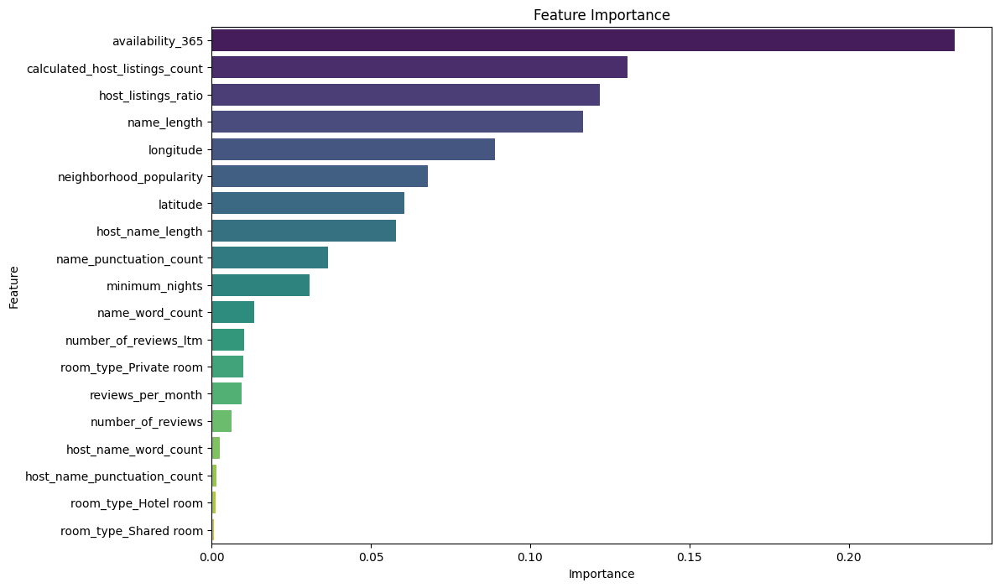

In [104]:
# Feature importance analysis
feature_importance = pd.DataFrame({'Feature': X_train.columns, 'Importance': model.feature_importances_})
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance, palette='viridis')
plt.title("Feature Importance")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()


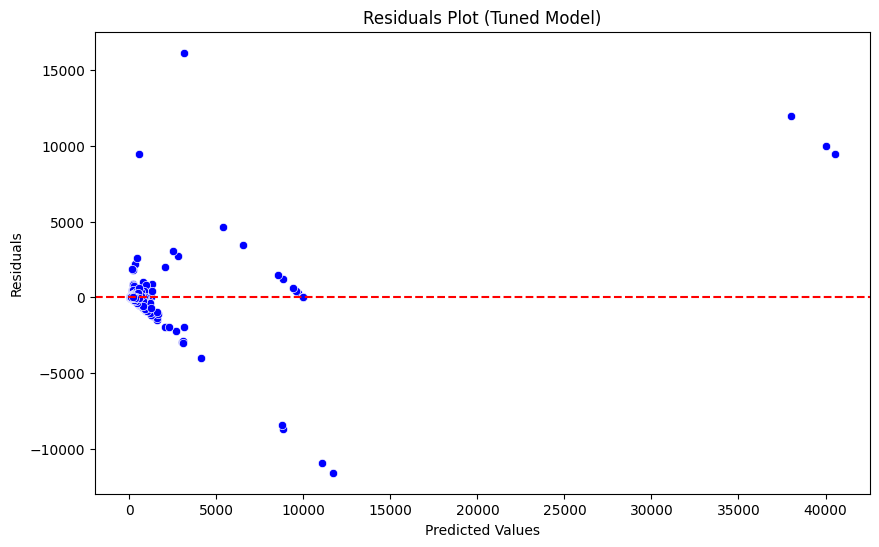

In [64]:
# Assuming 'model' is your tuned model
y_pred_tuned = best_model.predict(X_test)
residuals_tuned = y_test - y_pred_tuned

# Plot residuals
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred_tuned, y=residuals_tuned, color='blue')
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residuals Plot (Tuned Model)')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()


In [65]:
from sklearn.model_selection import cross_val_score

cv_scores_tuned = cross_val_score(best_model, X, y, cv=5, scoring='neg_mean_squared_error')
cv_rmse_tuned = np.sqrt(-cv_scores_tuned)
print(f"Cross-Validation RMSE (Tuned Model): {np.mean(cv_rmse_tuned)}")


Cross-Validation RMSE (Tuned Model): 1775.5604535169737


Analyze the impact of neighborhood or location on rental prices. Properties in popular or centrally located neighborhoods may command higher prices. Recommend property owners to align their prices with the overall trends in their specific neighborhood.

In [66]:
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.model_selection import train_test_split, cross_val_score
# from sklearn.metrics import mean_absolute_error, mean_squared_error
# from sklearn.model_selection import GridSearchCV

# # Assuming 'cleaned_df' is your preprocessed DataFrame
# X = training_df.drop(['price'], axis=1)
# y = training_df['price']

# # Split the dataset into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Build a Random Forest Regressor model
# rf_model = RandomForestRegressor(random_state=42)

# # Hyperparameter tuning using GridSearchCV
# param_grid = {
#     'n_estimators': [50, 100, 200],
#     'max_depth': [None, 10, 20],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4]
# }

# grid_search = GridSearchCV(rf_model, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
# grid_search.fit(X_train, y_train)

# # Get the best model from the grid search
# best_model = grid_search.best_estimator_

# # Evaluate the model on the test set
# y_pred = best_model.predict(X_test)

# # Calculate metrics
# mae = mean_absolute_error(y_test, y_pred)
# rmse = mean_squared_error(y_test, y_pred, squared=False)

# # Cross-validation for a more robust evaluation
# cv_scores = cross_val_score(best_model, X, y, cv=5, scoring='neg_mean_squared_error')
# cv_rmse = np.sqrt(-cv_scores)

# # Print the results
# print(f"Mean Absolute Error (MAE): {mae}")
# print(f"Root Mean Squared Error (RMSE): {rmse}")
# print(f"Cross-Validation RMSE: {np.mean(cv_rmse)}")


Mean Absolute Error (MAE): 191.03066204788166
Root Mean Squared Error (RMSE): 872.9803130277437
Cross-Validation RMSE: 1766.2348322310675


In [84]:
from sklearn.tree import export_text
from sklearn.ensemble import RandomForestRegressor

# Assuming you have a RandomForestRegressor model named 'rf_model'
# If not, you can train one using the previous code

# Extract one decision tree from the Random Forest (e.g., the first tree)
one_tree = rf_model.estimators_[0]

# Visualize the decision tree
tree_rules = export_text(one_tree, feature_names=list(X.columns))
print("Decision Tree Rules:\n", tree_rules)


AttributeError: 'RandomForestRegressor' object has no attribute 'estimators_'

In [69]:
training_df.dtypes

latitude                          float64
longitude                         float64
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
name_length                         int64
host_name_length                    int64
name_word_count                     int64
host_name_word_count                int64
name_punctuation_count              int64
host_name_punctuation_count         int64
room_type_Hotel room                 bool
room_type_Private room               bool
room_type_Shared room                bool
neighborhood_popularity           float64
host_listings_ratio               float64
dtype: object

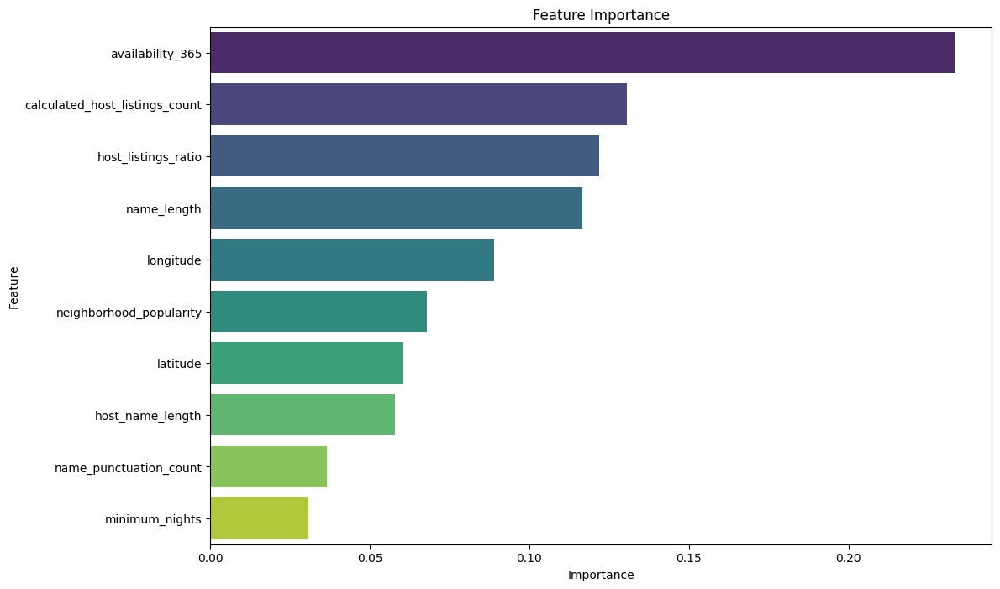

In [72]:
# Feature importance analysis
feature_importance = pd.DataFrame({'Feature': X_train.columns, 'Importance': model.feature_importances_})
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

# Plot feature importance
no_of_top = 10
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance.head(no_of_top), palette='viridis')
plt.title("Feature Importance")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()

In [73]:
# Print the list of influential features and their importance scores
print("Top Features Influencing Rental Prices:")
print(feature_importance.head(no_of_top))


Top Features Influencing Rental Prices:
                           Feature  Importance
6                 availability_365    0.233219
5   calculated_host_listings_count    0.130603
18             host_listings_ratio    0.121840
8                      name_length    0.116529
1                        longitude    0.088910
17         neighborhood_popularity    0.067777
0                         latitude    0.060500
9                 host_name_length    0.057873
12          name_punctuation_count    0.036438
2                   minimum_nights    0.030796


# comparative Analysis

In [74]:
# Specify the columns of interest
selected_columns = [
    'latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
    'calculated_host_listings_count', 'availability_365', 'name_length', 'host_name_length',
    'name_word_count', 'host_name_word_count', 'name_punctuation_count', 'host_name_punctuation_count',
    'room_type_Hotel room', 'room_type_Private room', 'room_type_Shared room',
    'neighborhood_popularity', 'host_listings_ratio', 'price'  # Including 'price' as the target variable
]

# Create a new DataFrame with the selected columns
selected_df = training_df[selected_columns].copy()


In [82]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Separate features and target variable
X = selected_df.drop('price', axis=1)
y = selected_df['price']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (important for KNN)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the KNN model
knn_model = KNeighborsRegressor(n_neighbors=2)  # You can adjust the number of neighbors (n_neighbors) as needed
knn_model.fit(X_train_scaled, y_train)

# Predict on the test set
y_pred = knn_model.predict(X_test_scaled)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)

# Print the evaluation metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")


Mean Absolute Error (MAE): 271.30428039702235
Root Mean Squared Error (RMSE): 2310.495144242783


In [83]:
from sklearn.metrics import r2_score

# Predict on the training set
y_train_pred = knn_model.predict(X_train_scaled)

# Calculate R-squared for the training set
r2_train = r2_score(y_train, y_train_pred)

# Print the training R-squared
print(f"Training R-squared: {r2_train}")


Training R-squared: 0.6500830929802757


In [89]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error


# Build the Decision Tree model
decision_tree_model = DecisionTreeRegressor(random_state=42)
decision_tree_model.fit(X_train, y_train)

# Predict on the test set
y_pred = decision_tree_model.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)

# Print the evaluation metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Calculate R-squared for the training set
r2_train = decision_tree_model.score(X_train, y_train)
print(f"Training R-squared: {r2_train}")


Mean Absolute Error (MAE): 159.9404227906089
Root Mean Squared Error (RMSE): 796.1204489853983
Training R-squared: 0.9517676845265747


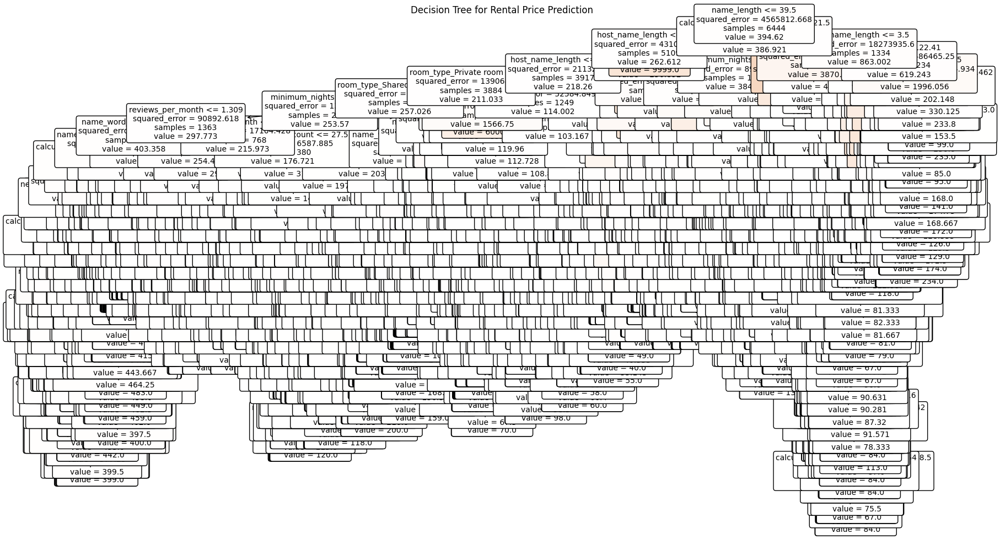

In [90]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Plot the Decision Tree
plt.figure(figsize=(20, 12))
plot_tree(decision_tree_model, feature_names=X.columns, filled=True, rounded=True, fontsize=10, class_names=["Price"])
plt.title("Decision Tree for Rental Price Prediction")
plt.show()


save file.

In [91]:
plt.savefig("/kaggle/working/decision_tree_plot.png")


<Figure size 640x480 with 0 Axes>

### Using Linear Regression


In [94]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


linear_regression_model = LinearRegression()
linear_regression_model.fit(X_train, y_train)

# Predict on the test set
y_pred = linear_regression_model.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared: {r2}")

Mean Absolute Error (MAE): 462.36823138400644
Root Mean Squared Error (RMSE): 2342.1882786892784
R-squared: 0.012504356604101319


In [95]:
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler



# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the Support Vector Machine Regressor
svm_regressor = SVR(kernel='linear')  # You can experiment with different kernels ('linear', 'rbf', etc.)
svm_regressor.fit(X_train_scaled, y_train)

# Predict on the test set
y_pred = svm_regressor.predict(X_test_scaled)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared: {r2}")


Mean Absolute Error (MAE): 276.8427214475436
Root Mean Squared Error (RMSE): 2364.4016863807997
R-squared: -0.006315362358674248
